# Intro Task, Object Localization

In [ ]:
# install libraries/packages/modules

!pip install -U git+https://github.com/albumentations-team/albumentations
!pip install timm
!pip install --upgrade opencv-contrib-python

  Cloning https://github.com/albumentations-team/albumentations to /tmp/pip-req-build-9t_whhhs
  Running command git clone --filter=blob:none --quiet https://github.com/albumentations-team/albumentations /tmp/pip-req-build-9t_whhhs
  Resolved https://github.com/albumentations-team/albumentations to commit 3c510e1422f6663ccd5026950af2d9ea85b5302a
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 56.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 MB 12.6 MB/s eta 0:00:00
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.8.0.76
    Uninstalling opencv-contrib-python-4.8.0.76:
      Successfully uninstalled opencv-contrib-python-4.8.0.76


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from tqdm.notebook import tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import os
import xml.etree.ElementTree as ET
import csv

In [ ]:
import sys
sys.path.append('/content/drive')

# Creating CSV file

In [ ]:
data = []
xml_dir = 'drive/MyDrive/Images dataset/images deep learning/annotations/'


for xml_file in os.listdir(xml_dir):

    if xml_file.endswith('.xml'):

        tree = ET.parse(os.path.join(xml_dir, xml_file))
        root = tree.getroot()

        # Extract the information from the XML
        img_path = 'drive/MyDrive/license plates/images/' + root.find('filename').text
        xmin = int(root.find('.//xmin').text)
        ymin = int(root.find('.//ymin').text)
        xmax = int(root.find('.//xmax').text)
        ymax = int(root.find('.//ymax').text)
        width = int(root.find('.//width').text)
        height = int(root.find('.//height').text)
        label = root.find('.//name').text #We do not need this now

        data.append([img_path, xmin, ymin, xmax, ymax, width, height, label])


csv_file = 'drive/MyDrive/Images dataset/images deep learning/annotations/annotations.csv'

with open(csv_file, 'w', newline='') as file:

    writer = csv.writer(file)

    # Write the header and file
    writer.writerow(['img_path', 'xmin', 'ymin', 'xmax', 'ymax', 'width', 'height', 'label'])
    writer.writerows(data)

print(f'CSV file "{csv_file}" has been created successfully!')


CSV file "drive/MyDrive/license plates/annotations/annotations.csv" has been created successfully!


# Configurations

In [ ]:
CSV_FILE = 'drive/MyDrive/Images dataset/images deep learning/annotations/annotations.csv'
DATA_DIR = 'drive/MyDrive/Images dataset/images deep learning/images/'

DEVICE = "cuda"

BATCH_SIZE = 16
IMG_SIZE = 224

LR = 0.001
EPOCHS = 40
MODEL_NAME = "efficientnet_b0"

In [ ]:
df = pd.read_csv(CSV_FILE)

# Understand the dataset

In [ ]:
row = df.iloc[5]
img = cv2.imread(row.img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

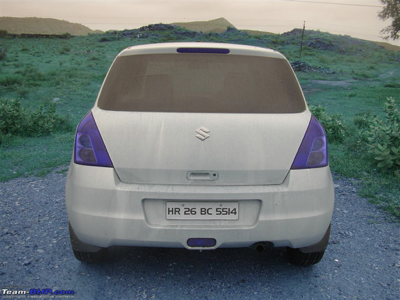

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
pt1 = (row.xmin, row.ymin)
pt2 = (row.xmax, row.ymax)
bnd_box = cv2.rectangle(img, pt1, pt2, (0,255,0)) #Draw the bounding box

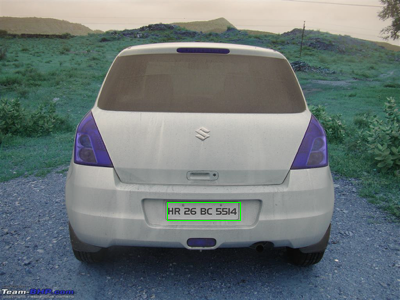

In [ ]:
cv2_imshow(img)

In [ ]:
train_df, valid_df = train_test_split(df, test_size = 0.20, random_state = 42)

In [ ]:
train_df.head()

,img_path,xmin,ymin,xmax,ymax,width,height,label
132,drive/MyDrive/license plates/images/Cars210.png,54,90,315,159,400,266,licence
354,drive/MyDrive/license plates/images/Cars416.png,150,207,234,221,400,300,licence
31,drive/MyDrive/license plates/images/Cars125.png,280,196,355,257,400,260,licence
84,drive/MyDrive/license plates/images/Cars177.png,149,166,272,193,400,238,licence
297,drive/MyDrive/license plates/images/Cars369.png,176,253,325,280,500,400,licence


# Augmentations

Here we need to whatch out with the labels (coordinates of the bounding box).If we rotate the image we need to deal also with its associated labels.


In [ ]:
import albumentations as A

In [ ]:
train_aug = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(0.5), # Probability of fliping the image
    A.VerticalFlip(0.5)
], bbox_params = A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

val_aug = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)

], bbox_params = A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

# Create Custom Dataset

In [ ]:
class ObjLocDataset (torch.utils.data.Dataset):

  def __init__(self, df, augmentations):
    self.df = df
    self.augmentations = augmentations

  def __len__(self):
    return len(self.df)

  def __getitem__ (self, idx):

    row = df.iloc[idx]

    xmin = row.xmin
    ymin = row.ymin
    xmax = row.xmax
    ymax = row.ymax

    bbox = [[xmin,ymin,xmax,ymax]]

    img_path = row.img_path
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if self.augmentations:

      data = self.augmentations(image = img, bboxes = bbox, class_labels = [None])
      img = data["image"]
      bbox = data["bboxes"][0]

    img = torch.from_numpy(img).permute(2,0,1)  # /255?  (h, w, c) - > (c,h,w)
    bbox = torch.Tensor(bbox)

    return img, bbox

In [ ]:
trainset = ObjLocDataset(train_df, train_aug)
valset = ObjLocDataset(valid_df, val_aug)

In [ ]:
print(f"Total examples of the training set: {len(trainset)}")
print(f"Total examples of the validation set: {len(valset)}")

Total examples of the training set: 346
Total examples of the validation set: 87


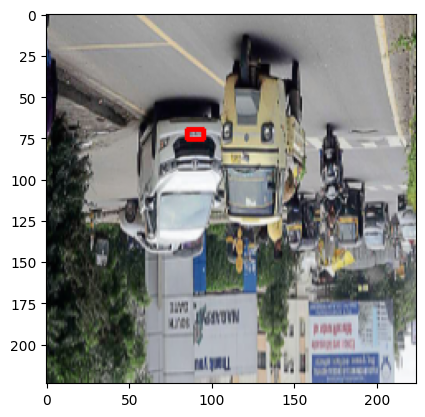

In [ ]:
img, bbox = trainset[8]

xmin, ymin, xmax, ymax = bbox

pt1 = (int(xmin), int(ymin))
pt2 = (int(xmax), int(ymax))

bnd_img = cv2.rectangle(img.permute(1, 2, 0).numpy(), pt1, pt2,(255,0,0),2)
plt.imshow(bnd_img)

# Load dataset into batches

In [ ]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size = BATCH_SIZE, shuffle = True)
validloader = torch.utils.data.DataLoader(valset, batch_size = BATCH_SIZE, shuffle = False)

In [ ]:
print("Total no. batches in trainloader : {}".format(len(trainloader)))
print("Total no. batches in validloader : {}".format(len(validloader)))

Total no. batches in trainloader : 22
Total no. batches in validloader : 6


In [ ]:
for images, bboxes in trainloader:
  break;

print("Shape of one batch images : {}".format(images.shape))
print("Shape of one batch bboxes : {}".format(bboxes.shape))

Shape of one batch images : torch.Size([16, 3, 224, 224])
Shape of one batch bboxes : torch.Size([16, 4])


# Create Model

In [ ]:
from torch import nn
import timm

In [ ]:
class ObjLocModel(nn.Module):

  def __init__(self):

    super(ObjLocModel, self).__init__()

    self.backbone = timm.create_model(MODEL_NAME, pretrained = True, num_classes = 4)

  def forward(self, images, gt_bboxes=None):

    bboxes = self.backbone(images)

    if gt_bboxes is not None:
      loss = nn.MSELoss()(bboxes, gt_bboxes)  # Calculate the Mean Squared Error loss, focalnloos,...
      return bboxes, loss  # Return both predictions and the loss

    return bboxes

In [ ]:
model = ObjLocModel()
model.to(DEVICE); # ; to avoid printing model architecture

In [ ]:
random_img = torch.rand(1,3,224, 224).to(DEVICE)
model(random_img).shape

torch.Size([1, 4])

# Create Train and Eval Function

In [ ]:
def train_fn (model, dataloader, optimizer):

  total_loss = 0.0
  model.train() # Dropout ON, training mode

  for data in tqdm(dataloader):

    images, gt_bboxes = data

    images, gt_bboxes = images.float().to(DEVICE), gt_bboxes.to(DEVICE)

    bboxes, loss = model(images, gt_bboxes)

    # loss.requires_grad = True
    loss = loss.mean()

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    total_loss += loss.item()

  return total_loss / len(dataloader)

In [ ]:
def eval_fn (model, dataloader):
  total_loss = 0.0
  model.eval() # Evaluation mode

  with torch.no_grad():
    for data in tqdm(dataloader):

      images, gt_bboxes = data

      images, gt_bboxes = images.float().to(DEVICE), gt_bboxes.to(DEVICE)

      bboxes, loss = model(images, gt_bboxes)

      loss = loss.mean()
      total_loss += loss.item()

    return total_loss / len(dataloader)


#Training Loop

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr =LR)

In [ ]:
best_valid_loss = np.Inf

train_losses = []
valid_losses = []

for i in range(EPOCHS):

  train_loss = train_fn(model, trainloader, optimizer)
  train_losses.append(train_loss)

  valid_loss = eval_fn(model, validloader)
  valid_losses.append(valid_loss)

  if valid_loss < best_valid_loss:

    torch.save(model.state_dict(), "/content/drive/MyDrive/Images dataset/images deep learning/best_model.pt")
    print("Saved WEIGHTS")
    best_valid_loss = valid_loss

  print(f"Epoch {i+1}, train loss {train_loss}, validation loss {valid_loss}")

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 1, train loss 6497.4593283913355, validation loss 3201.4510294596353


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 2, train loss 2773.9170865145597, validation loss 6504.764567057292


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 3, train loss 1565.631758256392, validation loss 5873.177897135417


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 4, train loss 837.9694366455078, validation loss 4565.533935546875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 5, train loss 510.51835562966085, validation loss 3938.679443359375


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 6, train loss 308.15060979669744, validation loss 4411.592529296875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 7, train loss 252.9658757990057, validation loss 4519.0234781901045


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 8, train loss 212.73551628806374, validation loss 4223.0999755859375


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 9, train loss 183.64795580777255, validation loss 3982.1986083984375


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 10, train loss 172.2383884083141, validation loss 3386.256306966146


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 11, train loss 137.22446406971324, validation loss 3328.788126627604


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 12, train loss 147.35971416126597, validation loss 3342.4375813802085


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 13, train loss 135.0894133827903, validation loss 3174.461385091146


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 14, train loss 169.9570036801425, validation loss 3484.260538736979


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 15, train loss 123.47108234058727, validation loss 3641.708292643229


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 16, train loss 135.29108732396907, validation loss 3446.373006184896


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 17, train loss 144.3988037109375, validation loss 3977.1346028645835


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 18, train loss 120.50284628434615, validation loss 3237.7791341145835


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 19, train loss 111.63775166598234, validation loss 3261.4034830729165


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 20, train loss 136.89464031566274, validation loss 2967.6107584635415


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 21, train loss 109.68911604447798, validation loss 3525.9029947916665


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 22, train loss 119.623685316606, validation loss 3553.026896158854


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 23, train loss 112.4185074892911, validation loss 2918.820027669271


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 24, train loss 100.72466321425004, validation loss 3401.033935546875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 25, train loss 125.34990432045676, validation loss 3425.7240397135415


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 26, train loss 102.23596572875977, validation loss 3317.4102376302085


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 27, train loss 116.61218799244274, validation loss 2950.550537109375


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 28, train loss 152.62542672590777, validation loss 3019.223388671875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 29, train loss 107.43851124156605, validation loss 3479.943400065104


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 30, train loss 120.58836737546054, validation loss 3310.62548828125


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 31, train loss 106.9139608036388, validation loss 3258.014119466146


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 32, train loss 130.86639673059636, validation loss 3366.7740071614585


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 33, train loss 101.06858028065075, validation loss 2699.850138346354


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 34, train loss 101.55154193531384, validation loss 3507.656494140625


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 35, train loss 100.88715535944158, validation loss 2946.831298828125


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 36, train loss 88.91962814331055, validation loss 2960.2626139322915


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 37, train loss 82.89139435508035, validation loss 2835.205525716146


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 38, train loss 85.91825407201594, validation loss 2644.0623372395835


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 39, train loss 79.91424716602673, validation loss 2983.5211588541665


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 40, train loss 99.05644416809082, validation loss 2673.4976603190103


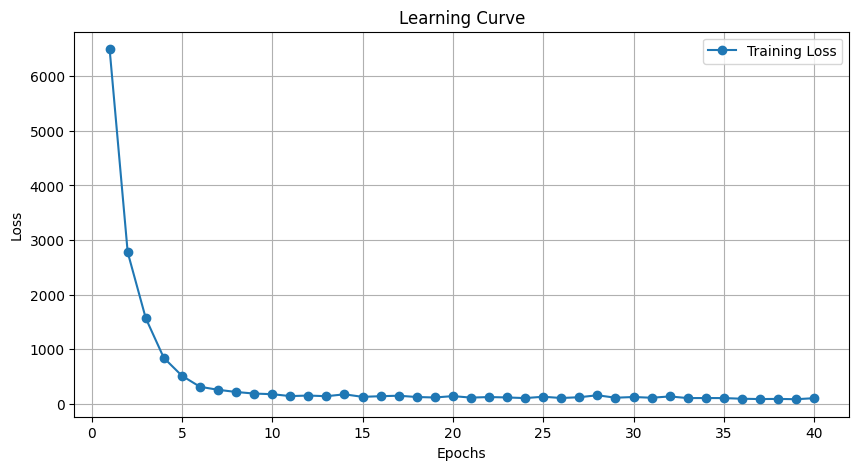

In [ ]:
epochs = list(range(1, len(train_losses) + 1))

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses, label='Training Loss', marker='o')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve')
plt.legend()

plt.grid(True)
plt.show()

#Inference

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/Images dataset/images deep learning/best_model.pt"))
model.eval()

with torch.no_grad():

  image, gt_bbox = valset[124] # c, h , w)
  image = image.unsqueeze(0).to(DEVICE) # (bc, c, h , w)

  out_box = model(image.float())

  print(out_box)
  print(gt_bbox)

tensor([[  6.0340,  30.6672, 234.2251, 166.9394]], device='cuda:0')
tensor([ 15.6800,  48.5966, 216.7200, 178.4407])


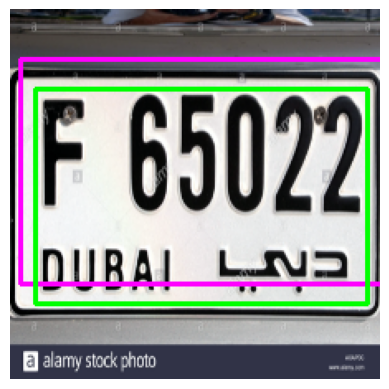

In [ ]:
image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

# Extract the bounding box coordinates from out_box
ps1 = out_box.cpu().numpy()[0][:2]
ps2 = out_box.cpu().numpy()[0][2:]
ps1 = tuple(map(int, ps1))
ps2 = tuple(map(int, ps2))

cv2.rectangle(image_np, ps1, ps2, (255,0,255),2)

# Extract the bounding box coordinates from true box
ps1 = gt_bbox.cpu().numpy()[:2]
ps2 = gt_bbox.cpu().numpy()[2:]
ps1 = tuple(map(int, ps1))
ps2 = tuple(map(int, ps2))

cv2.rectangle(image_np, ps1, ps2, (0,255,0),2)

plt.imshow(image_np)
plt.axis('off')  # Remove axis labels and ticks
plt.show()

In [ ]:
def calculate_iou(gt_bbox, out_box):

    # Extract coordinates of the two bounding boxes
    ps1 = out_box.cpu().numpy()[0][:2]
    ps2 = out_box.cpu().numpy()[0][2:]
    ps1 = tuple(map(int, ps1))
    ps2 = tuple(map(int, ps2))

    ps1_1 = gt_bbox.cpu().numpy()[:2]
    ps2_1 = gt_bbox.cpu().numpy()[2:]
    ps1_1 = tuple(map(int, ps1_1))
    ps2_1 = tuple(map(int, ps2_1))

    # Calculate the area of the intersection
    intersection_x1 = max(ps1[0], ps1_1[0])
    intersection_y1 = max(ps1[1], ps1_1[1])
    intersection_x2 = min(ps2[0], ps2_1[0])
    intersection_y2 = min(ps2[1], ps2_1[1])

    if intersection_x1 < intersection_x2 and intersection_y1 < intersection_y2:
        intersection_area = (intersection_x2 - intersection_x1) * (intersection_y2 - intersection_y1)

    else:
        intersection_area = 0.0

    # Calculate the area of both bounding boxes
    box1_area = (ps2[0] - ps1[0]) * (ps2[1] - ps1[1])
    box2_area = (ps2_1[0] - ps1_1[0]) * (ps2_1[1] - ps1_1[1])

    # Union area
    union_area = box1_area + box2_area - intersection_area

    # IoU
    iou = intersection_area / union_area if union_area > 0 else 0.0

    return iou

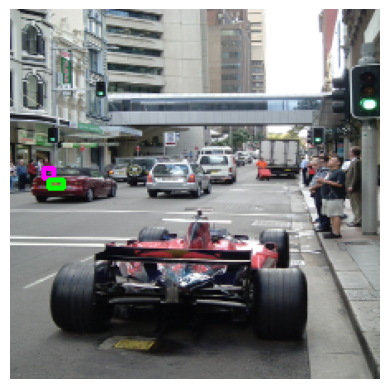

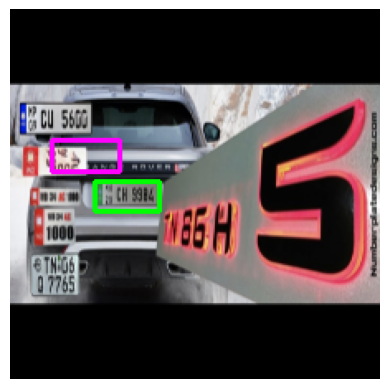

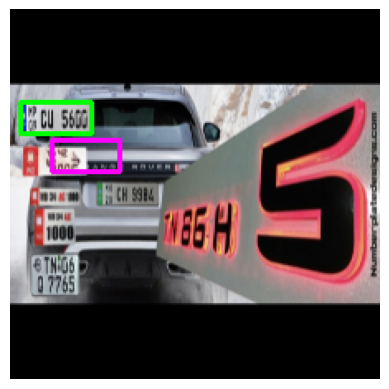

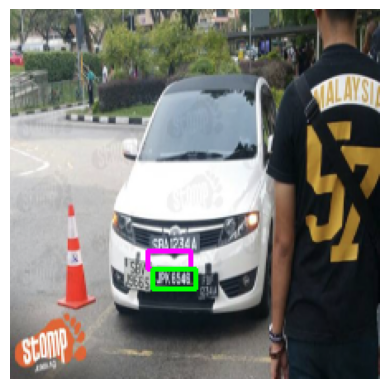

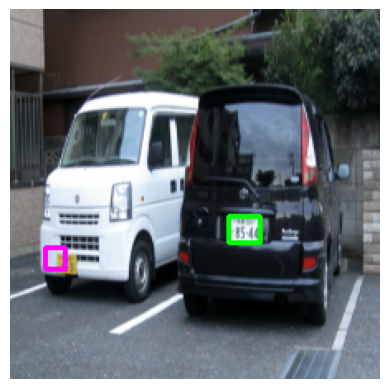

...

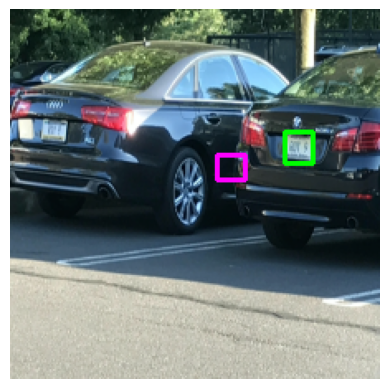

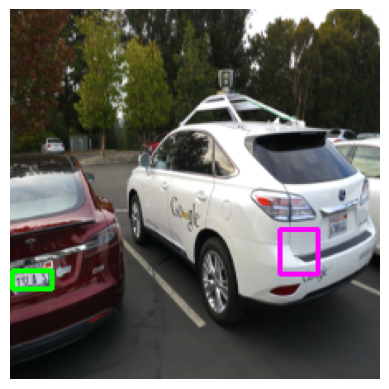

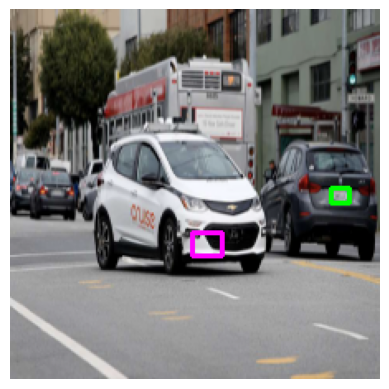

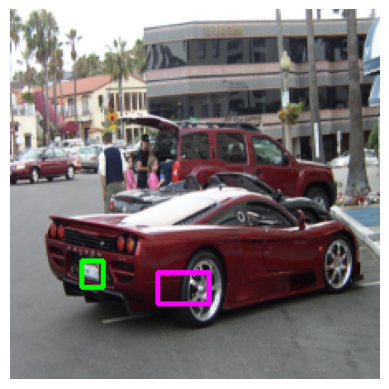

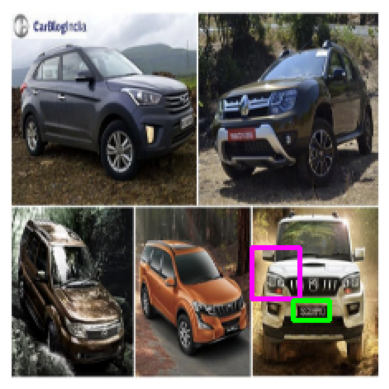

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/Images dataset/images deep learning/best_model.pt"))
model.eval()

iou_values = []

with torch.no_grad():

  for sample in valset:

    image, gt_bbox = sample # c, h , w)
    image = image.unsqueeze(0).to(DEVICE) # (bc, c, h , w)

    out_box = model(image.float())

    iou_value = calculate_iou(gt_bbox, out_box)

    # Find Errors
    if iou_value == 0:

      image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

      # Extract the bounding box coordinates from out_box
      ps1 = out_box.cpu().numpy()[0][:2]
      ps2 = out_box.cpu().numpy()[0][2:]
      ps1 = tuple(map(int, ps1))
      ps2 = tuple(map(int, ps2))

      cv2.rectangle(image_np, ps1, ps2, (255,0,255),2)

      # Extract the bounding box coordinates from true box
      ps1 = gt_bbox.cpu().numpy()[:2]
      ps2 = gt_bbox.cpu().numpy()[2:]
      ps1 = tuple(map(int, ps1))
      ps2 = tuple(map(int, ps2))

      cv2.rectangle(image_np, ps1, ps2, (0,255,0),2)

      plt.imshow(image_np)
      plt.axis('off')  # Remove axis labels and ticks
      plt.show()

    iou_values.append(iou_value)

In [ ]:
average_iou = sum(iou_values) / len(iou_values)
print("Average IoU:", average_iou)

Average IoU: 0.6739068628284872


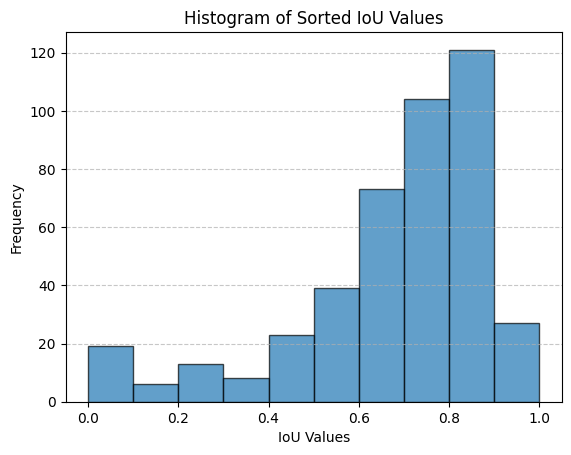

In [ ]:
sorted_iou_values = sorted(iou_values, reverse=True)

plt.hist(sorted_iou_values, bins=10, range=(0, 1), edgecolor='k', alpha=0.7)
plt.xlabel('IoU Values')
plt.ylabel('Frequency')
plt.title('Histogram of Sorted IoU Values')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
def calculate_precision_recall(sorted_iou_values, threshold=0.5):

    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for iou in sorted_iou_values:

        if iou >= threshold:
            true_positives += 1

        if iou == 0:
            false_negatives+=1

        else:
            false_positives += 1

    precision = true_positives / float(true_positives + false_positives)
    recall = true_positives / float(true_positives + false_negatives)
    f1 = 2 * precision * recall / (precision + recall)

    return precision, recall, f1

precision, recall, f1 = calculate_precision_recall(sorted_iou_values, threshold=0.5)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1: {f1:.2f}")

Precision: 0.47
Recall: 0.96
F1: 0.63


In [ ]:
import random

lista = []

for i in range(9):
    lista.append(random.randint(0, len(valset)))

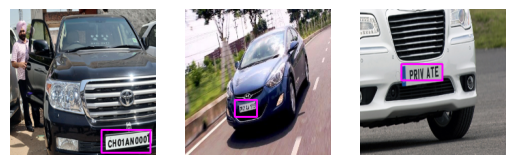

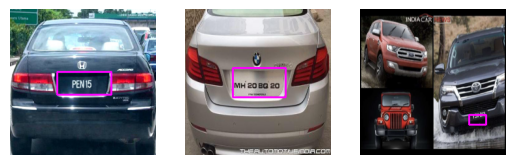

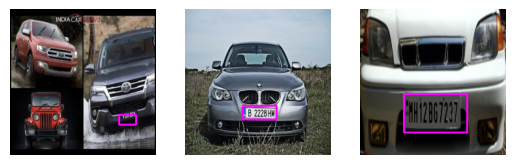

In [ ]:
# Define the number of columns (photos per row)
num_columns = 3
i = 0

for idx in lista:
    with torch.no_grad():
        image, gt_bbox = valset[idx]  # c, h, w
        image = image.unsqueeze(0).to(DEVICE)  # (bc, c, h, w)

        out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

    # Extract the bounding box coordinates from out_box
    ps1 = out_box.cpu().numpy()[0][:2]
    ps2 = out_box.cpu().numpy()[0][2:]

    ps1 = tuple(map(int, ps1))
    ps2 = tuple(map(int, ps2))

    cv2.rectangle(image_np, ps1, ps2, (255, 0, 255), 2)

    plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
    plt.imshow(image_np)
    plt.axis('off')  # Remove axis labels and ticks

    if i % num_columns == num_columns - 1:
        plt.show()  # Display the row when it's full

    i+=1

# Show any remaining images in the last row
if len(lista) % num_columns != 0:
    plt.show()

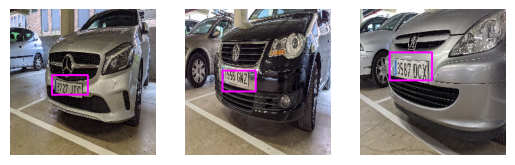

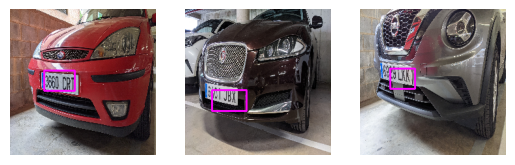

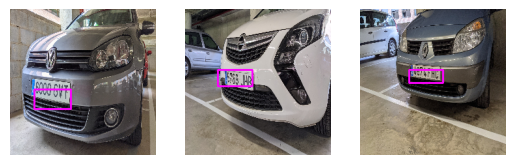

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/Images dataset/images deep learning/best_model.pt"))
model.eval()

num_columns = 3

for i in range(9):

  # Define the directory path and image file name
  directory_path = '/content/drive/MyDrive/Images dataset/images deep learning/Test/Lateral/Lateral'
  image_files = os.listdir(directory_path)
  img_name = image_files[i]

  # Read the image
  image = cv2.imread(os.path.join(directory_path, img_name))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  comp = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)
])

  with torch.no_grad():

    results = comp(image=image)
    image = results['image']
    image = torch.from_numpy(image)

    image = image.permute(2,0,1).unsqueeze(0).to(DEVICE) # (bc, c, h , w)

    out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

  # Extract the bounding box coordinates from out_box
  ps1 = out_box.cpu().numpy()[0][:2]
  ps2 = out_box.cpu().numpy()[0][2:]
  ps1 = tuple(map(int, ps1))
  ps2 = tuple(map(int, ps2))

  cv2.rectangle(image_np, ps1, ps2, (255,0,255), 2)

  plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
  plt.imshow(image_np)
  plt.axis('off')  # Remove axis labels and ticks

  if i % num_columns == num_columns - 1:
      plt.show()  # Display the row when it's full

  i+=1

# Show any remaining images in the last row
if 9 % num_columns != 0:
    plt.show()

In [ ]:
torch.save(model.state_dict(), 'drive/MyDrive/Images dataset/images deep learning/best_model.pt') # Saving the model

# Building EfficientNet from Scratch: No Pretrained Weight

In this approach, we'll utilize the model without any precomputed weights. However, we'll extend the number of training epochs and incorporate data augmentation techniques to enhance the diversity of our training dataset and bolster the model's resilience. These techniques will include random rotations, flips, and adjustments to color

In [ ]:
DEVICE = "cuda"

BATCH_SIZE = 16
IMG_SIZE = 224

LR = 0.0005
EPOCHS = 60
MODEL_NAME = "efficientnet_b0"

In [ ]:
train_aug = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(0.5), # Probability of fliping the image
    A.VerticalFlip(0.5),

], bbox_params = A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

val_aug = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)

], bbox_params = A.BboxParams(format='pascal_voc', label_fields = ['class_labels']))

In [ ]:
trainset = ObjLocDataset(train_df, train_aug)
valset = ObjLocDataset(valid_df, val_aug)

In [ ]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size = BATCH_SIZE, shuffle = True)
validloader = torch.utils.data.DataLoader(valset, batch_size = BATCH_SIZE, shuffle = False)

In [ ]:
class ObjLocModel(nn.Module):

  def __init__(self):

    super(ObjLocModel, self).__init__()

    self.backbone = timm.create_model(MODEL_NAME, pretrained = False, num_classes = 4)

  def forward(self, images, gt_bboxes=None):

    bboxes = self.backbone(images)

    if gt_bboxes is not None:
      loss = nn.MSELoss()(bboxes, gt_bboxes)  # Calculate the Mean Squared Error loss
      return bboxes, loss  # Return both predictions and the loss

    return bboxes

In [ ]:
model = ObjLocModel()
model.to(DEVICE);

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr =LR)

In [ ]:
import torch
import numpy as np

train_losses = []
valid_losses = []

best_valid_loss = np.Inf

patience = 5

for i in range(EPOCHS):

    # Training loop
    train_loss = train_fn(model, trainloader, optimizer)
    train_losses.append(train_loss)

    # Validation loop
    valid_loss = eval_fn(model, validloader)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        torch.save(model.state_dict(), 'best_model.pt')
        print("Saved WEIGHTS")
        best_valid_loss = valid_loss
        patience = 5  # Reset patience when a new best validation loss is found

    print(f"Epoch {i+1}, train loss {train_loss}, validation loss {valid_loss}")

    # Implement early stopping
    if i > 0 and valid_losses[-1] > valid_losses[-2]:
        patience -= 1
        if patience == 0:
            print("Early stopping triggered. Training stopped.")
            break


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 1, train loss 10634.287863991478, validation loss 5723.189615885417


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 2, train loss 8821.596324573864, validation loss 6966.858805338542


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 3, train loss 7262.428755326705, validation loss 13644.09521484375


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 4, train loss 6278.056218927557, validation loss 4652.252604166667


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 5, train loss 5587.107510653409, validation loss 4480.560953776042


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 6, train loss 4914.1254106001425, validation loss 4018.842488606771


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 7, train loss 4346.4508500532675, validation loss 5628.200520833333


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 8, train loss 3775.9849187677555, validation loss 3226.073527018229


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 9, train loss 3331.6238125887785, validation loss 2445.5029296875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 10, train loss 2815.2050503817472, validation loss 2417.0571492513022


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 11, train loss 2393.3553078391337, validation loss 2208.0048828125


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 12, train loss 1977.9730723987925, validation loss 1761.1831461588542


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 13, train loss 1643.3237526633523, validation loss 1416.9876302083333


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 14, train loss 1329.3918429287996, validation loss 1110.203633626302


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 15, train loss 1025.0353476784446, validation loss 879.3810424804688


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 16, train loss 821.1379727450284, validation loss 825.5039876302084


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 17, train loss 694.0958238081498, validation loss 571.4298451741537


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 18, train loss 577.8374158685857, validation loss 464.6959991455078


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 19, train loss 419.5338817943226, validation loss 338.86199442545575


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 20, train loss 362.76773348721593, validation loss 447.2227376302083


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 21, train loss 322.9612402482466, validation loss 237.19332631429037


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 22, train loss 244.47913776744497, validation loss 412.53564071655273


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 23, train loss 237.25801225142047, validation loss 1013.5991058349609


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 24, train loss 183.22954975474966, validation loss 215.68125661214194


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 25, train loss 143.29150373285466, validation loss 248.80628458658853


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 26, train loss 164.01688350330699, validation loss 159.2705593109131


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 27, train loss 159.44221236489037, validation loss 128.6914971669515


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 28, train loss 142.69839304143733, validation loss 103.00140062967937


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 29, train loss 105.40914864973588, validation loss 104.02433109283447


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 30, train loss 146.92130088806152, validation loss 77.1567948659261


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 31, train loss 111.14477643099698, validation loss 54.810581843058266


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 32, train loss 138.71044835177335, validation loss 58.115397453308105


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 33, train loss 141.69722678444603, validation loss 83.31342538197835


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 34, train loss 170.67752942171964, validation loss 276.5569483439128


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 35, train loss 128.43819947676226, validation loss 55.62777042388916


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 36, train loss 141.23892922834918, validation loss 56.300408363342285


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 37, train loss 93.89497834985906, validation loss 70.76493612925212
Early stopping triggered. Training stopped.


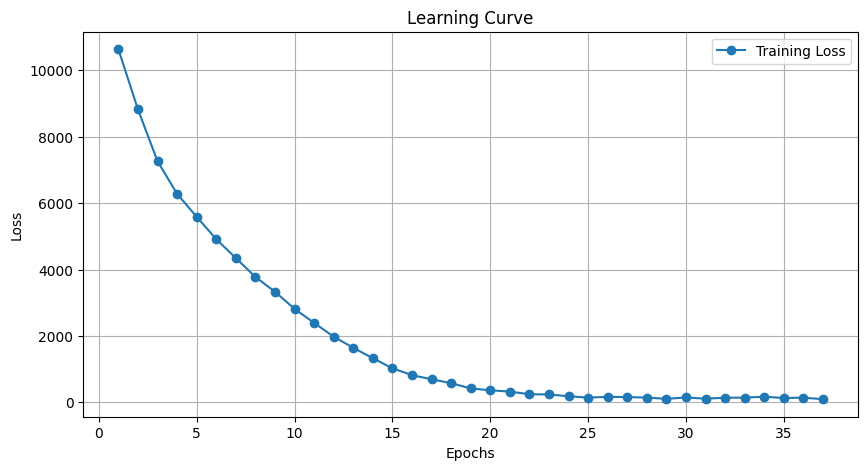

In [ ]:
epochs = list(range(1, len(train_losses) + 1))

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses, label='Training Loss', marker='o')
#plt.plot(epochs, valid_losses, label='Validation Loss', marker='o')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve')
plt.legend()

plt.grid(True)
plt.show()

In [ ]:
import random

lista = []

for i in range(9):
    lista.append(random.randint(0, len(valset)))

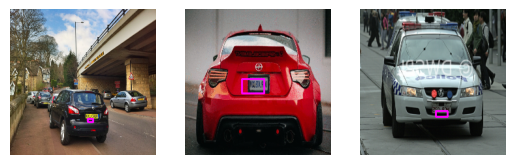

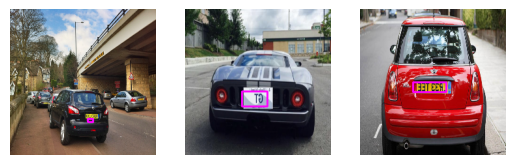

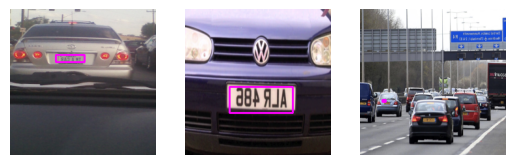

In [ ]:
# Load the model's state dictionary
model.load_state_dict(torch.load("/content/drive/MyDrive/Images dataset/images deep learning/model_from_scratch.pt"))
model.eval()

# Assuming you have defined valset and DEVICE earlier

# Define the number of columns (photos per row)
num_columns = 3
i = 0

for idx in lista:
    with torch.no_grad():
        image, gt_bbox = valset[idx]  # c, h, w
        image = image.unsqueeze(0).to(DEVICE)  # (bc, c, h, w)

        out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

    # Extract the bounding box coordinates from out_box
    ps1 = out_box.cpu().numpy()[0][:2]
    ps2 = out_box.cpu().numpy()[0][2:]

    ps1 = tuple(map(int, ps1))
    ps2 = tuple(map(int, ps2))

    cv2.rectangle(image_np, ps1, ps2, (255, 0, 255), 2)
    image_np = np.flipud(image_np)

    plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
    plt.imshow(image_np)
    plt.axis('off')  # Remove axis labels and ticks

    if i % num_columns == num_columns - 1:
        plt.show()  # Display the row when it's full

    i+=1

# Show any remaining images in the last row
if len(lista) % num_columns != 0:
    plt.show()

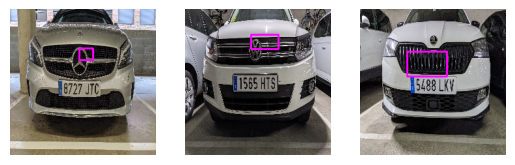

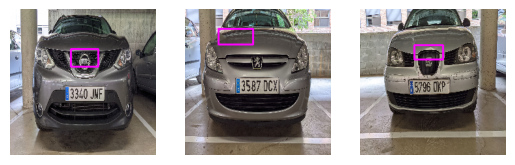

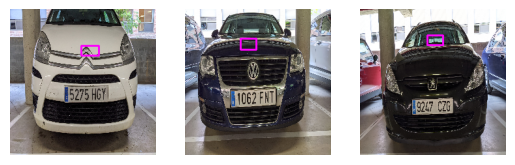

In [ ]:
for i in range(9):

  # Define the directory path and image file name
  directory_path = '/content/drive/MyDrive/Images dataset/images deep learning/Test/Frontal/Frontal'
  image_files = os.listdir(directory_path)
  img_name = image_files[i]

  # Read the image
  image = cv2.imread(os.path.join(directory_path, img_name))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  comp = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)
])

  with torch.no_grad():

    results = comp(image=image)
    image = results['image']
    image = torch.from_numpy(image)

    image = image.permute(2,0,1).unsqueeze(0).to(DEVICE) # (bc, c, h , w)

    out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

  # Extract the bounding box coordinates from out_box
  ps1 = out_box.cpu().numpy()[0][:2]
  ps2 = out_box.cpu().numpy()[0][2:]
  ps1 = tuple(map(int, ps1))
  ps2 = tuple(map(int, ps2))

  cv2.rectangle(image_np, ps1, ps2, (255,0,255), 2)

  plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
  plt.imshow(image_np)
  plt.axis('off')  # Remove axis labels and ticks

  if i % num_columns == num_columns - 1:
      plt.show()  # Display the row when it's full

  i+=1

# Show any remaining images in the last row
if len(lista) % num_columns != 0:
    plt.show()


In [ ]:
torch.save(model.state_dict(), 'drive/MyDrive/Images dataset/images deep learning/best_model_from_scratch.pt') # Saving the model

The model seems to be overfitting, it works well with validation data but has a poor performance with external data. Here, we add some regularization (L2 regularization) to try to avoid this situation.

In [ ]:
class ObjLocModel(nn.Module):

  def __init__(self):

    super(ObjLocModel, self).__init__()

    self.backbone = timm.create_model(MODEL_NAME, pretrained = False, num_classes = 4)
    self.lambda_reg = 0.01

  def forward(self, images, gt_bboxes=None):

    bboxes = self.backbone(images)

    if gt_bboxes is not None:
      loss = nn.MSELoss()(bboxes, gt_bboxes)  # Calculate the Mean Squared Error loss

      # Add L2 regularization to the model's parameters
      l2_reg = torch.tensor(0.0).to(images.device)
      for param in self.parameters():
        l2_reg += torch.norm(param)

      # Combine the loss with regularization
      total_loss = loss + self.lambda_reg * l2_reg

      return bboxes, total_loss  # Return both predictions and the loss

    return bboxes

In [ ]:
model2 = ObjLocModel()
model2.to(DEVICE);

In [ ]:
optimizer = torch.optim.Adam(model2.parameters(), lr =LR)

train_losses = []
valid_losses = []

best_valid_loss = np.Inf

patience = 5

for i in range(EPOCHS):

    # Training loop
    train_loss = train_fn(model2, trainloader, optimizer)
    train_losses.append(train_loss)

    # Validation loop
    valid_loss = eval_fn(model2, validloader)
    valid_losses.append(valid_loss)

    if valid_loss < best_valid_loss:
        torch.save(model2.state_dict(), 'best_model.pt')
        print("Saved WEIGHTS")
        best_valid_loss = valid_loss
        patience = 5

    print(f"Epoch {i+1}, train loss {train_loss}, validation loss {valid_loss}")

    # Implement early stopping
    if i > 0 and valid_losses[-1] > valid_losses[-2]:
        patience -= 1
        if patience == 0:
            print("Early stopping triggered. Training stopped.")
            break


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 1, train loss 10986.510475852272, validation loss 8838.824055989584


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 2, train loss 9210.082386363636, validation loss 6427.986246744792


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 3, train loss 7797.605158025568, validation loss 6362.32763671875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 4, train loss 6736.16015625, validation loss 6590.081624348958


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 5, train loss 5912.067316228693, validation loss 5238.041748046875


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 6, train loss 5271.673273259943, validation loss 4914.566487630208


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 7, train loss 4636.337513316761, validation loss 4520.0924886067705


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 8, train loss 4109.512612082742, validation loss 4295.8644612630205


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 9, train loss 3565.898126775568, validation loss 4160.575439453125


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 10, train loss 3060.1546741832385, validation loss 2688.723876953125


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 11, train loss 2608.4976806640625, validation loss 6835.071126302083


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 12, train loss 2174.897039240057, validation loss 4609.7812093098955


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 13, train loss 1877.3905195756392, validation loss 2198.728312174479


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 14, train loss 1509.5900740189986, validation loss 4786.080240885417


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 15, train loss 1249.50510337136, validation loss 4541.332173665364


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 16, train loss 992.7241765802556, validation loss 945.5912373860677


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 17, train loss 799.1659074263139, validation loss 885.4696756998698


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 18, train loss 635.2486537586559, validation loss 1371.3612976074219


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 19, train loss 541.9309865778142, validation loss 620.0251057942709


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 20, train loss 453.7216928655451, validation loss 466.3033040364583


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 21, train loss 342.6169322620739, validation loss 246.57410685221353


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 22, train loss 309.6912578235973, validation loss 334.9958140055339


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 23, train loss 257.5470314025879, validation loss 171.36850357055664


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 24, train loss 234.5371672890403, validation loss 198.49449030558267


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 25, train loss 217.51961794766513, validation loss 361.2390619913737


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 26, train loss 181.6738499728116, validation loss 210.90682983398438


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 27, train loss 214.35468847101384, validation loss 138.93617566426596


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Saved WEIGHTS
Epoch 28, train loss 154.89205620505592, validation loss 96.35029602050781


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 29, train loss 198.86128061467952, validation loss 129.3091252644857


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 30, train loss 184.90598921342328, validation loss 386.886178334554


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 31, train loss 145.25587983564898, validation loss 162.27340698242188


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 32, train loss 182.05807876586914, validation loss 143.5366643269857


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 33, train loss 171.708476673473, validation loss 359.77506256103516


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 34, train loss 178.86102190884677, validation loss 127.25174331665039


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 35, train loss 139.40237669511274, validation loss 235.82898966471353


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 36, train loss 152.02432597767222, validation loss 205.76784896850586


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 37, train loss 167.20193238691851, validation loss 130.44668324788412


  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

Epoch 38, train loss 135.65066181529653, validation loss 233.613650004069
Early stopping triggered. Training stopped.


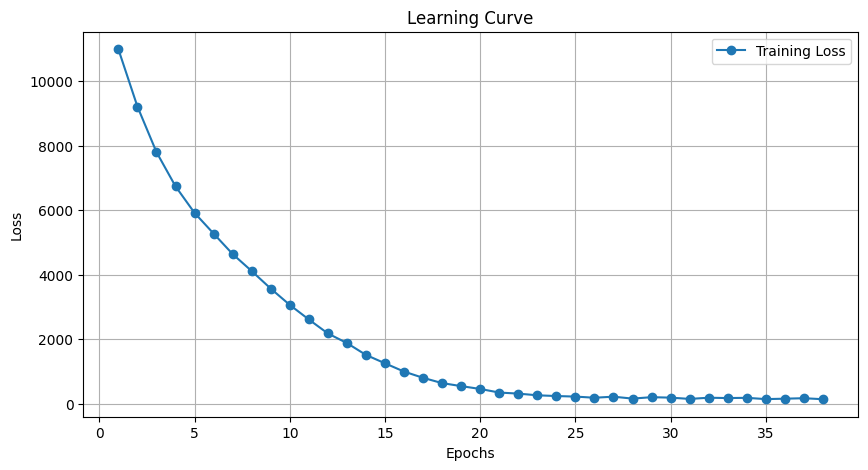

In [ ]:
epochs = list(range(1, len(train_losses) + 1))

plt.figure(figsize=(10, 5))
plt.plot(epochs, train_losses, label='Training Loss', marker='o')
#plt.plot(epochs, valid_losses, label='Validation Loss', marker='o')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Learning Curve')
plt.legend()

plt.grid(True)
plt.show()

In [ ]:
import random

lista = []

for i in range(9):
    lista.append(random.randint(0, len(valset)))

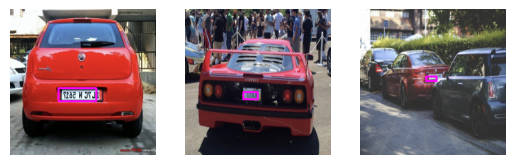

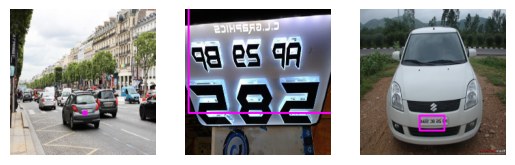

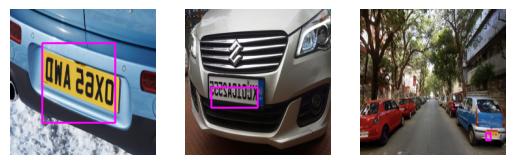

In [ ]:
# Load the model's state dictionary
model.load_state_dict(torch.load("best_model.pt"))
model.eval()

# Define the number of columns (photos per row)
num_columns = 3
i = 0

for idx in lista:
    with torch.no_grad():
        image, gt_bbox = valset[idx]  # c, h, w
        image = image.unsqueeze(0).to(DEVICE)  # (bc, c, h, w)

        out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

    # Extract the bounding box coordinates from out_box
    ps1 = out_box.cpu().numpy()[0][:2]
    ps2 = out_box.cpu().numpy()[0][2:]

    ps1 = tuple(map(int, ps1))
    ps2 = tuple(map(int, ps2))

    cv2.rectangle(image_np, ps1, ps2, (255, 0, 255), 2)
    image_np = np.flipud(image_np)

    plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
    plt.imshow(image_np)
    plt.axis('off')  # Remove axis labels and ticks

    if i % num_columns == num_columns - 1:
        plt.show()  # Display the row when it's full

    i+=1

# Show any remaining images in the last row
if len(lista) % num_columns != 0:
    plt.show()

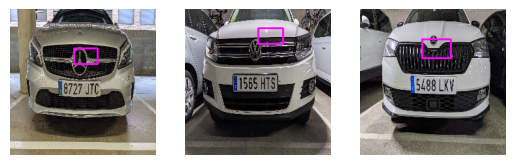

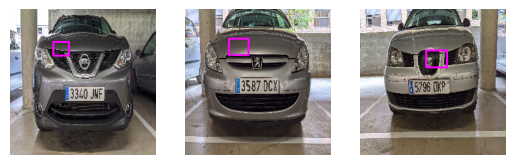

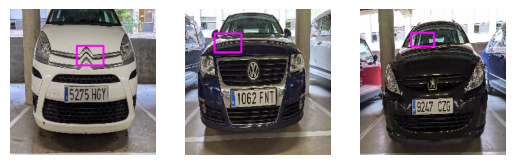

In [ ]:
for i in range(9):

  # Define the directory path and image file name
  directory_path = '/content/drive/MyDrive/Images dataset/images deep learning/Test/Frontal/Frontal'
  image_files = os.listdir(directory_path)
  img_name = image_files[i]

  # Read the image
  image = cv2.imread(os.path.join(directory_path, img_name))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  comp = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)
])

  with torch.no_grad():

    results = comp(image=image)
    image = results['image']
    image = torch.from_numpy(image)

    image = image.permute(2,0,1).unsqueeze(0).to(DEVICE) # (bc, c, h , w)

    out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

  # Extract the bounding box coordinates from out_box
  ps1 = out_box.cpu().numpy()[0][:2]
  ps2 = out_box.cpu().numpy()[0][2:]
  ps1 = tuple(map(int, ps1))
  ps2 = tuple(map(int, ps2))

  cv2.rectangle(image_np, ps1, ps2, (255,0,255), 2)

  plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
  plt.imshow(image_np)
  plt.axis('off')  # Remove axis labels and ticks

  if i % num_columns == num_columns - 1:
      plt.show()  # Display the row when it's full

  i+=1

# Show any remaining images in the last row
if len(lista) % num_columns != 0:
    plt.show()

# Reading license plates

We will use the best model obtained in the previous sections to locate the plates and then Easy OCR to read the digits.

In [ ]:
!pip install easyocr

In [ ]:
import easyocr

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/Images dataset/images deep learning/best_model.pt"))
model.eval();

In [ ]:
render = easyocr.Reader(['en']) # Use OCR

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

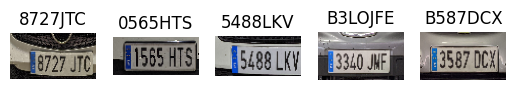

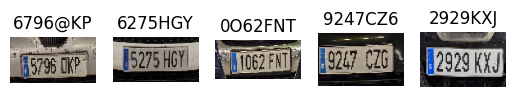

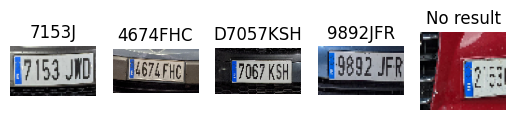

In [ ]:
directory_path = '/content/drive/MyDrive/Images dataset/images deep learning/Test/Frontal/Frontal'
image_files = os.listdir(directory_path)

num_columns = 5
margin = 9

for i in range(len(image_files)-1):

  img_name = image_files[i]

  # Read the image
  image = cv2.imread(os.path.join(directory_path, img_name))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  comp = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)])

  with torch.no_grad():

    results = comp(image=image)
    image = results['image']
    image = torch.from_numpy(image)

    image = image.permute(2,0,1).unsqueeze(0).to(DEVICE) # (bc, c, h , w)
    out_box = model(image.float())

    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

  # Extract the bounding box coordinates from out_box
  ps1 = out_box.cpu().numpy()[0][:2]
  ps2 = out_box.cpu().numpy()[0][2:]
  ps1 = tuple(map(int, ps1))
  ps2 = tuple(map(int, ps2))

  ps1 = (max(0, ps1[0] - margin), max(0, ps1[1] - margin))
  ps2 = (min(image_np.shape[1], ps2[0] + margin), min(image_np.shape[0], ps2[1] + margin))

  cropped_image = image_np[ps1[1]:ps2[1], ps1[0]:ps2[0]]
  result = render.readtext((cropped_image))

  plt.subplot(1, num_columns, i % num_columns + 1)  # Create subplots for each photo
  plt.imshow(cropped_image)
  plt.axis('off')  # Remove axis labels and ticks

  if result:
    result = result[0][1].upper()
    result = result.replace("[", "").replace("]", "").replace("|", "").replace(" ","")
    plt.title(result)
  else:
    plt.title("No result")

  if i % num_columns == num_columns - 1:
      plt.show()  # Display the row when it's full

  i+=1

# Show any remaining images in the last row
if len(image_files) % num_columns != 0:
    plt.show()

In [ ]:
!pip install Levenshtein

In [ ]:
from Levenshtein import distance

def calculate_digit_accuracy(predicted_plate, correct_plate):

    dist = distance(predicted_plate, correct_plate)
    accuracy = 1 - (dist / max(len(predicted_plate), len(correct_plate))) # Inverse of the levensthein dist

    return accuracy*100


In [ ]:
directory_path = '/content/drive/MyDrive/Images dataset/images deep learning/Test/Frontal/Frontal'
image_files = os.listdir(directory_path)

num_columns = 5
margin = 9
mean_accuracy = []

for i in range(len(image_files)-1):

  img_name = image_files[i]

  # Read the image
  image = cv2.imread(os.path.join(directory_path, img_name))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  comp = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE)])

  with torch.no_grad():

    results = comp(image=image)
    image = results['image']
    image = torch.from_numpy(image)

    image = image.permute(2,0,1).unsqueeze(0).to(DEVICE) # (bc, c, h , w)
    out_box = model(image.float())
    image_np = np.transpose(image.squeeze().cpu().numpy(), (1, 2, 0))

  # Extract the bounding box coordinates from out_box
  ps1 = out_box.cpu().numpy()[0][:2]
  ps2 = out_box.cpu().numpy()[0][2:]
  ps1 = tuple(map(int, ps1))
  ps2 = tuple(map(int, ps2))

  ps1 = (max(0, ps1[0] - margin), max(0, ps1[1] - margin))
  ps2 = (min(image_np.shape[1], ps2[0] + margin), min(image_np.shape[0], ps2[1] + margin))


  cropped_image = image_np[ps1[1]:ps2[1], ps1[0]:ps2[0]]
  result = render.readtext((cropped_image))


  if result:
    result = result[0][1].upper()
    result = result.replace("[", "").replace("]", "").replace("|", "").replace(" ","")

    image_name = img_name.strip('.jpg')
    accuracy = calculate_digit_accuracy(result, image_name)
    mean_accuracy.append(accuracy)
    print(f"Predicted value: {result}, correct value: {image_name}. Digit Accuracy: {accuracy:.2f}%")


mean = sum(mean_accuracy) / len(mean_accuracy)
print(f"{mean:.2f} %")

Predicted value: 8727JTC, correct value: 8727JTC. Digit Accuracy: 100.00%
Predicted value: 0565HTS, correct value: 1565HTS. Digit Accuracy: 85.71%
Predicted value: 5488LKV, correct value: 5488LKV. Digit Accuracy: 100.00%
Predicted value: B3LOJFE, correct value: 3340JMF. Digit Accuracy: 28.57%
Predicted value: B587DCX, correct value: 3587DCX. Digit Accuracy: 85.71%
Predicted value: 6796@KP, correct value: 5796DKP. Digit Accuracy: 71.43%
Predicted value: 6275HGY, correct value: 5275HGY. Digit Accuracy: 85.71%
Predicted value: 0O62FNT, correct value: 1062FNT. Digit Accuracy: 71.43%
Predicted value: 9247CZ6, correct value: 9247CZG. Digit Accuracy: 85.71%
Predicted value: 2929KXJ, correct value: 2929KXJ. Digit Accuracy: 100.00%
Predicted value: 7153J, correct value: 7153JWD. Digit Accuracy: 71.43%
Predicted value: 4674FHC, correct value: 4674FHC. Digit Accuracy: 100.00%
Predicted value: D7057KSH, correct value: 7067KSH. Digit Accuracy: 75.00%
Predicted value: 9892JFR, correct value: 9892JFR